## Imports

In [7]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib
import folium
from folium.raster_layers import ImageOverlay
import leafmap
import rasterio
import pickle
import json
import os
import cv2
from skimage import measure, color
import pywt

In [8]:
import sys
from Utils.image_utils import DataLoader
from Utils.image_utils import show_in_pixel_space
rand_cmap = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))

In [3]:
import matplotlib.pyplot as plt
plt.close('all')          # closes all live figures
%matplotlib inline  

In [92]:
import matplotlib.pyplot as plt
%matplotlib widget

In [4]:
data_loader = DataLoader()

## Shadow Handling Testing

In [5]:
scene_id = "woolsey_0093"
scene_gdf, norm_image_path, image_path, scene_info, scene_dict = data_loader.GetSceneFromID(scene_id)

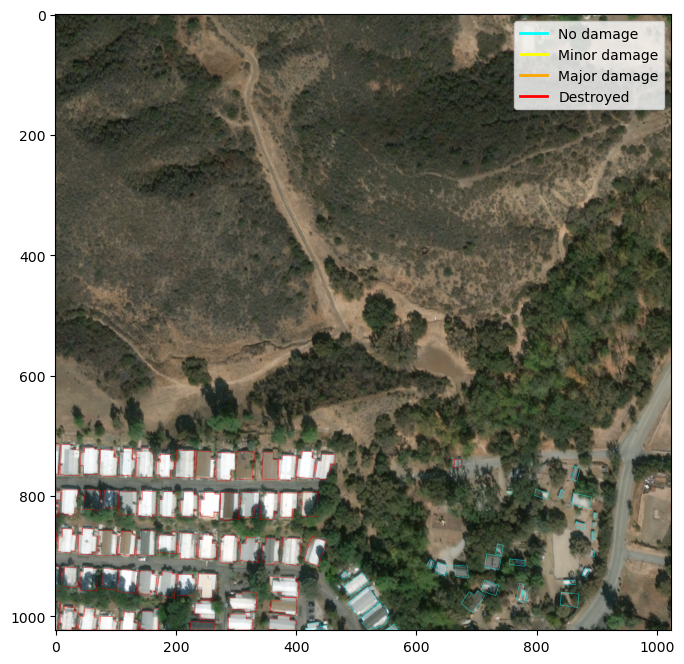

In [6]:
scene_image, scene_labels = data_loader.PlotImageFromSceneID()

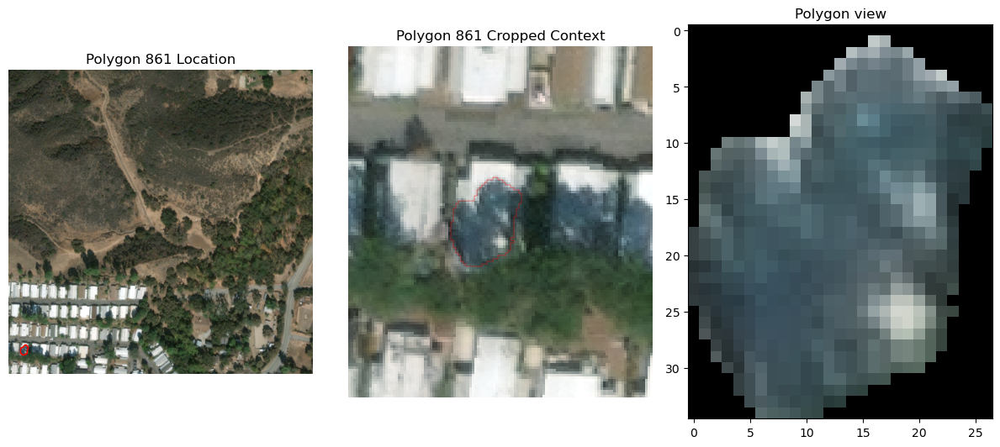

In [91]:
poly = data_loader.PlotImagePolygons(idx=862)

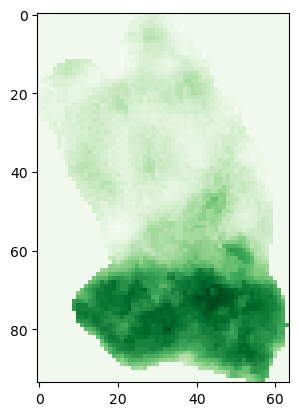

In [11]:
red = poly[:, :, 0].astype(float)
green = poly[:, :, 1].astype(float)
blue = poly[:, :, 2].astype(float)

red /= red.max()
green /= green.max()
blue /= blue.max()

# Compute Excess Green Index (ExG)
exg = 2 * green - red - blue

plt.imshow(exg, cmap='Greens')

In [8]:
def explore_with_underlay(scene_gdf, img):
    H, W = img.shape[:2]

    # flip vertically so Folium interprets it correctly
    img2 = np.flipud(img)

    # folium-compatible bounds: (top, left), (bottom, right)
    bounds = [(0, 0), (H, W)]

    # ensure CRS
    gdf = scene_gdf.set_crs("EPSG:3857")

    m = gdf.explore()

    ImageOverlay(
        image=img2,
        bounds=bounds,
        opacity=1.0,
        interactive=False,
        cross_origin=False,
        name="base image"
    ).add_to(m)

    folium.LayerControl().add_to(m)

    return m



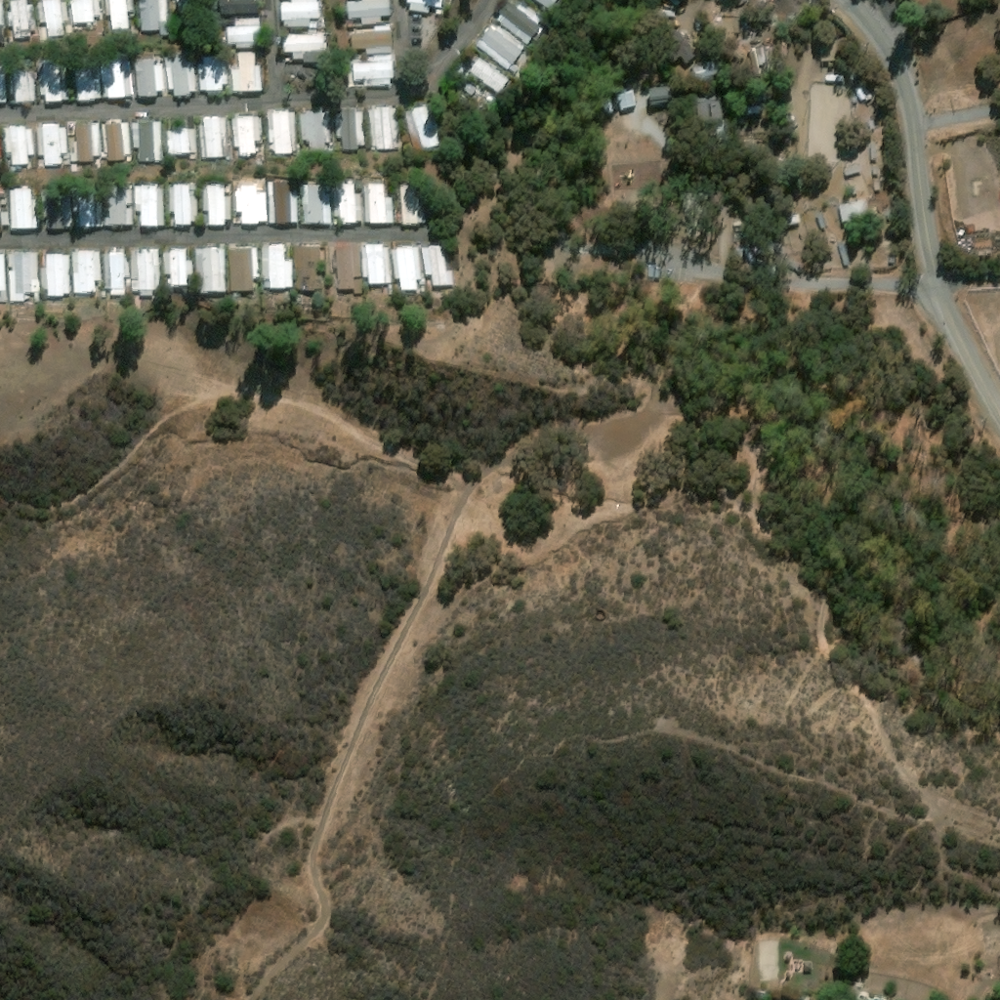

In [17]:
m = scene_gdf.explore(
    tooltip="id",     # hover shows ID
    popup=False       # disables that huge attribute panel
)
H, W = scene_image.shape[:2]
scene_image_f = np.flipud(scene_image)
bounds = [(H, 0), (0, W)] 
ImageOverlay(
    image=scene_image_f,
    bounds=bounds,
    opacity=1.0,
    interactive=False,
    cross_origin=False,
    name="base image"
).add_to(m)
m

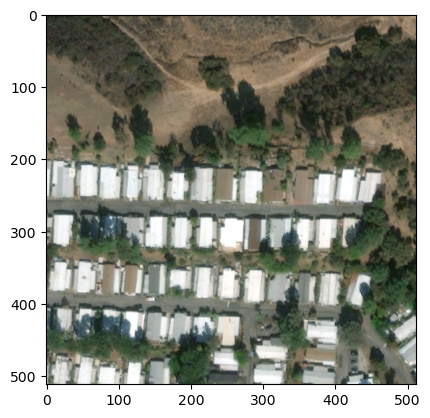

In [14]:
shadow_img = scene_image[512:1024, 0:512, :]
plt.imshow(shadow_img)
plt.show()

In [29]:
scene_info

scene_id                                                         woolsey_0093
fire_name                                                             woolsey
pre_image_path              woolsey/images/woolsey-fire_00000093_pre_disas...
pre_label_path              woolsey/labels/woolsey-fire_00000093_pre_disas...
post_image_path             woolsey/images/woolsey-fire_00000093_post_disa...
post_label_path             woolsey/labels/woolsey-fire_00000093_post_disa...
polygon_path                                        woolsey_0093_polygons.pkl
n_structures_total                                                         97
n_major_or_destroyed                                                       67
segmented                                                                True
n_polygons                                                             1782.0
pct_black                                                            0.314426
pct_segmented                                                   

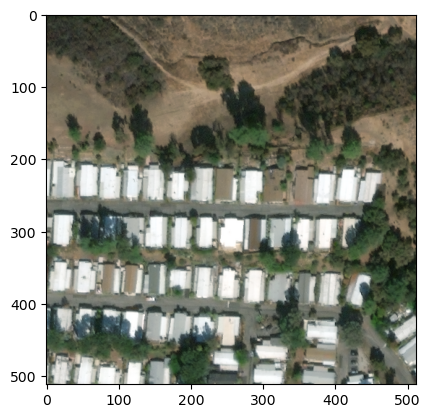

In [ ]:
wavelet = 'sym2'
out = []
for i in range(3):
    band = shadow_img[:, :, i]
    coeffs = pywt.dwt2(band, wavelet)
    out.append(coeffs)

inverse_bands = np.zeros_like(shadow_img)
for i in range(3):
    inverse = pywt.idwt2(out[i], wavelet)
    inverse_bands[:,:, i] = inverse

plt.imshow(inverse_bands)
plt.show()

In [82]:
def wavelet_shadow_candidates(img, wavelet="haar"):

    # 1. DWT per band
    coeffs = []
    for i in range(3):
        LL, (LH, HL, HH) = pywt.dwt2(img[:,:,i].astype(np.float32), wavelet)
        coeffs.append((LH, HL, HH))

    # 2. Wavelet energy per band
    E = None
    for (LH, HL, HH) in coeffs:
        E_band = LH*LH + HL*HL + HH*HH
        E = E_band if E is None else E + E_band

    # 3. Normalize energy
    E = (E - E.mean()) / (E.std() + 1e-6)

    # 4. Upsample to original size
    H, W = img.shape[0], img.shape[1]
    E_up = cv2.resize(E, (W, H), interpolation=cv2.INTER_NEAREST_EXACT)

    return E, E_up


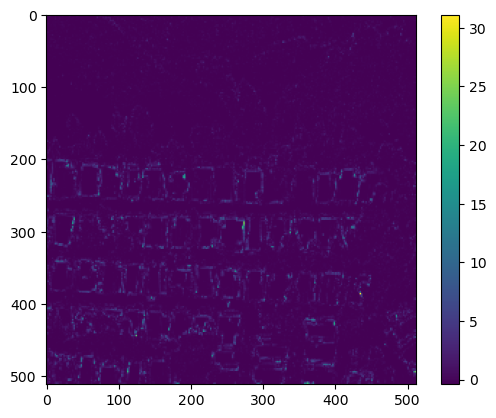

In [83]:
E, E_up = wavelet_shadow_candidates(shadow_img, wavelet='sym2')
plt.imshow(E_up)
plt.colorbar()
plt.show()

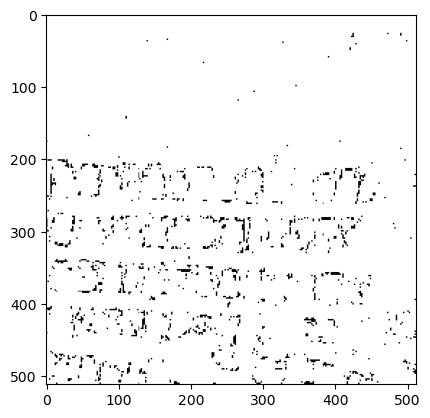

In [85]:
import cv2
import numpy as np

def threshold_otsu(E):
    # Normalize E to 0..255 for Otsu
    E_norm = (E - E.min()) / (E.max() - E.min() + 1e-8)
    E_255 = (E_norm * 255).astype(np.uint8)

    thresh, mask = cv2.threshold(E_255, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    # shadow = 1 / lit = 0
    return (mask > 0)
shadow_mask = threshold_otsu(E_up)
plt.imshow(shadow_mask, cmap='gray')
plt.show()

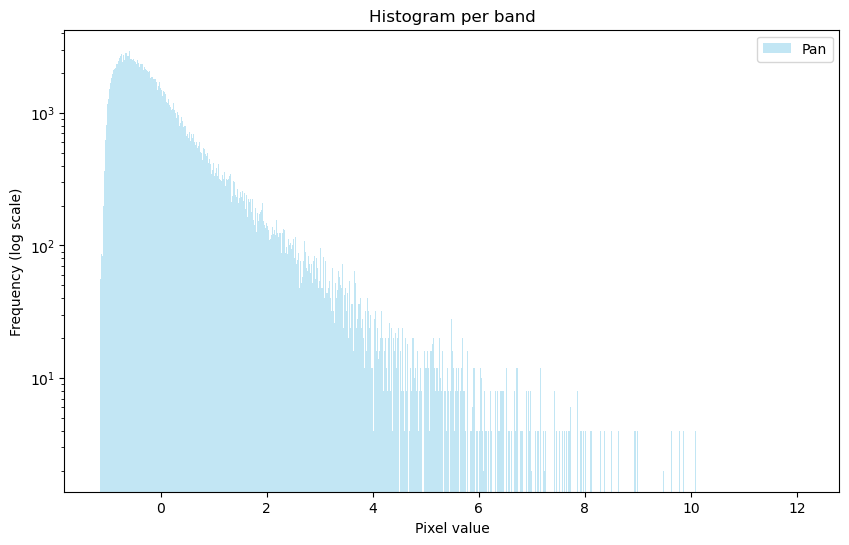

In [59]:
plt.figure(figsize=(10,6))
plt.hist(E_up.astype(np.float32).ravel(), bins=1000, alpha=0.5, label=f"Pan", color="skyblue")
plt.xlabel("Pixel value")
plt.ylabel("Frequency (log scale)")
plt.yscale("log")
plt.legend()
plt.title("Histogram per band")
plt.show()

In [84]:
import numpy as np
from scipy.stats import wasserstein_distance
from scipy.spatial.distance import jensenshannon

# compute histograms
h1, bins = np.histogram(E.astype(np.float32).ravel(), bins=1000, density=True)
h2, _    = np.histogram(E_up.astype(np.float32).ravel(), bins=bins, density=True)

# bin centers
values = 0.5 * (bins[:-1] + bins[1:])

emd = wasserstein_distance(values, values, u_weights=h1, v_weights=h2)
print("Wasserstein / EMD difference =", emd)

p = h1 / np.sum(h1)
q = h2 / np.sum(h2)
jsd = jensenshannon(p, q)
print("Jensen-Shannon divergence =", jsd)

Wasserstein / EMD difference = 0.000647472110645286
Jensen-Shannon divergence = 0.0025090803974442185


In [18]:
def detect_shadow_mask(img, v_thresh=0.35):
    """
    img: uint8 RGB, HWC
    v_thresh: threshold on V channel (0–1)
    returns: binary mask (True = shadow)
    """
    # convert RGB → HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    H, S, V = hsv[:,:,0], hsv[:,:,1]/255.0, hsv[:,:,2]/255.0

    # basic threshold on darkness
    shadow = V < v_thresh

    # refine: exclude pixels that are both dark and low saturation (too gray)
    shadow &= S > 0.1

    # morphological cleanup
    shadow = cv2.morphologyEx(shadow.astype(np.uint8), cv2.MORPH_OPEN, np.ones((3,3)))
    shadow = cv2.morphologyEx(shadow, cv2.MORPH_CLOSE, np.ones((5,5)))

    return shadow.astype(bool)

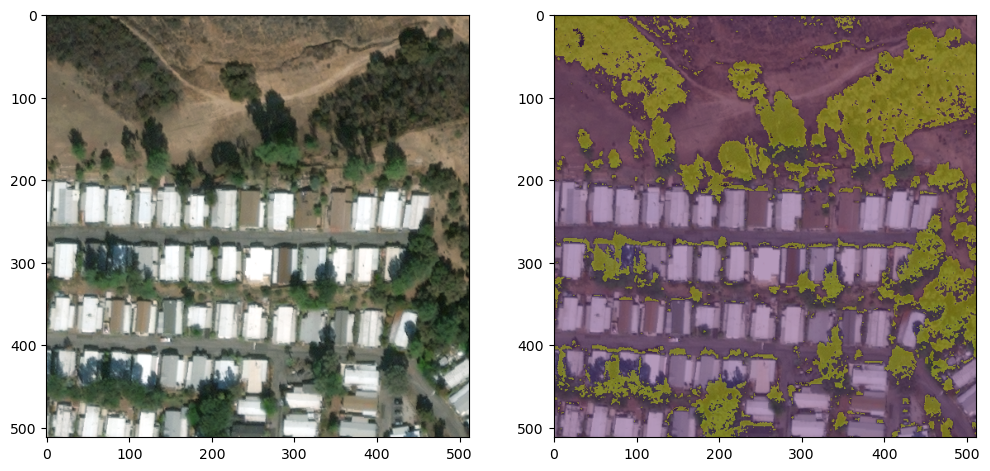

In [72]:
hsv = cv2.cvtColor(shadow_img, cv2.COLOR_RGB2HSV)
H, S, V = hsv[:,:,0], hsv[:,:,1]/255.0, hsv[:,:,2]/255.0

shadow = V < 0.3

shadow &= S > 0.1

fig, axs = plt.subplots(1,2, figsize=(12,8))
axs[0].imshow(shadow_img)
axs[1].imshow(shadow_img)
axs[1].imshow(shadow.astype(float), alpha=0.4, cmap='viridis')
plt.show()

In [74]:
from skimage.segmentation import slic

def compute_superpixels(img, n_segments=600, compactness=10):
    # img should be float RGB [0..1]
    img_float = img.astype(np.float32) / 255.0

    segments = slic(img_float, n_segments=n_segments, compactness=compactness, start_label=0)
    return segments

segments = compute_superpixels(shadow_img)

In [30]:
plt.figure(figsize=(10,10))
plt.imshow(shadow_img)
plt.imshow(segments, alpha=0.3, cmap=rand_cmap)
plt.colorbar()
plt.show()

NameError: name 'shadow_img' is not defined

<Figure size 1000x1000 with 0 Axes>

## Metadata Handling

In [11]:
image_meta = {
    "capture_date": [],
    "sensor": [],
    "gsd": [],
    "pan_resolution": [],
    "off_nadir_angle": [],
    "sun_azimuth": [],
    "sun_elevation": [],
    "target_azimuth": []
}

for i in range (len(xBD_data)):
    row = xBD_data.iloc[i]

    pre_image_label = row["pre_label_path"]

    with open(f"{data_config["data_root"]}{data_config["xBD_images_path"]}{pre_image_label}", 'r') as f:
        pre_label_data = json.load(f)
    
    metadata = pre_label_data['metadata']
    
    for key in image_meta.keys():
        image_meta[key].append(metadata.get(key, None))

image_meta_df = pd.DataFrame(image_meta)

In [12]:
xBD_data = pd.concat([xBD_data, image_meta_df], axis=1)

In [14]:
tmp = MAIN_CSV_PATH + ".tmp"
xBD_data.to_csv(tmp, index=False, lineterminator="\n")
os.replace(tmp, MAIN_CSV_PATH)